# Preparation and testing of model specification

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from itertools import product
from pathlib import Path
from time import time

import aesara
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as gg
import pymc as pm
import pymc.sampling_jax
import seaborn as sns
from matplotlib.lines import Line2D

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/pymc/sampling_jax.py:36: UserWarning: This module is experimental.


In [66]:
from speclet.analysis.arviz_analysis import describe_mcmc, extract_coords_param_names
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel
from speclet.data_processing.common import head_tail
from speclet.io import DataFile, data_path
from speclet.loggers import set_console_handler_level
from speclet.managers.data_managers import CrisprScreenDataManager, broad_only
from speclet.plot import set_speclet_theme
from speclet.project_configuration import arviz_config

In [4]:
# Logging.
set_console_handler_level("DEBUG")
aesara.config.exception_verbosity = "high"

# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"

# Constants
SEED = 847
np.random.seed(SEED)
arviz_config()

## Data

In [6]:
crispr_data_manager = CrisprScreenDataManager(
    DataFile.DEPMAP_CRC_SUBSAMPLE, transformations=[broad_only]
)
crc_data = crispr_data_manager.get_data()

In [7]:
for col in ["sgrna", "hugo_symbol", "depmap_id"]:
    print(f"'{col}': {crc_data[col].nunique()}")

'sgrna': 162
'hugo_symbol': 103
'depmap_id': 8


## Distributions

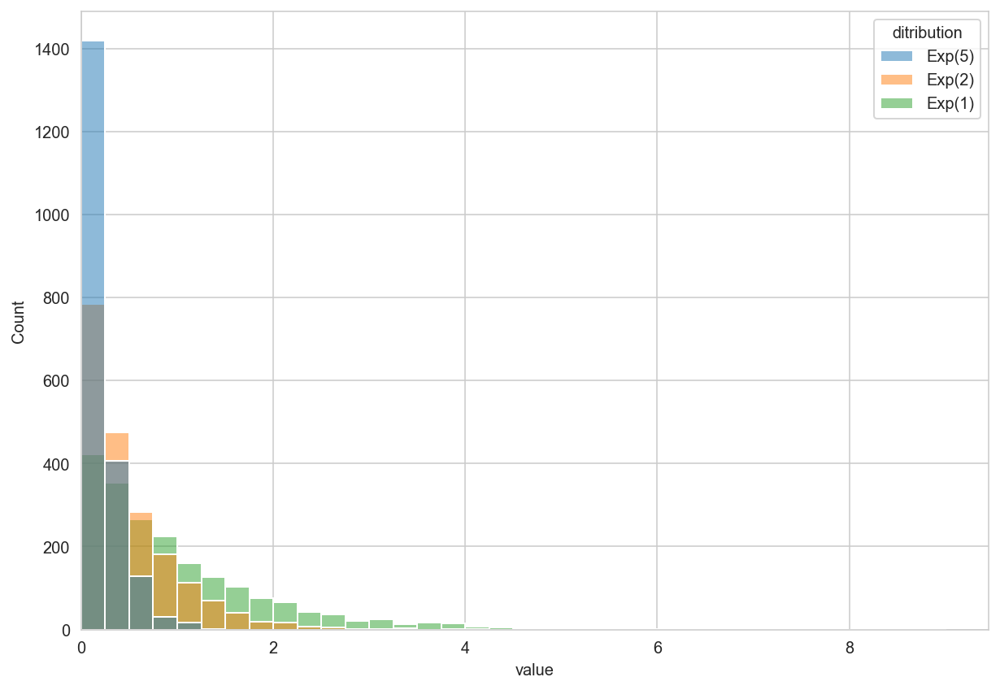

In [8]:
N = 2000
df = pd.DataFrame()
df = pd.concat(
    [
        df,
        # pd.DataFrame({"value": pm.draw(pm.HalfNormal.dist(0.5), N), "dist": "HN(0.5)"}),
        pd.DataFrame({"value": pm.draw(pm.Exponential.dist(5), N), "dist": "Exp(5)"}),
        pd.DataFrame({"value": pm.draw(pm.Exponential.dist(2), N), "dist": "Exp(2)"}),
        pd.DataFrame({"value": pm.draw(pm.Exponential.dist(1), N), "dist": "Exp(1)"}),
        # pd.DataFrame(
        #     {"value": pm.draw(pm.Exponential.dist(0.2), N), "dist": "Exp(0.5)"}
        # ),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(2, 1), N), "dist": "Gamma(2,1)"}),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(3, 1), N), "dist": "Gamma(3,1)"}),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(3, 2), N), "dist": "Gamma(3,2)"}),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(3, 4), N), "dist": "Gamma(3,4)"}),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(5, 1), N), "dist": "Gamma(5,1)"}),
        # pd.DataFrame(
        #     {"value": pm.draw(pm.Gamma.dist(10, 1), N), "dist": "Gamma(10,1)"}
        # ),
    ]
).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(10, 7))
sns.histplot(data=df, x="value", hue="dist", ax=ax, binwidth=0.25)
ax.get_legend().set_title("ditribution")
ax.set_xlim(0, None)
plt.show()

In [9]:
df.groupby("dist").describe()

value                                                              \
         count      mean       std       min       25%       50%       75%   
dist                                                                         
Exp(1)  2000.0  1.004431  1.002062  0.000989  0.299602  0.715611  1.370826   
Exp(2)  2000.0  0.501384  0.499321  0.000121  0.151409  0.338179  0.699095   
Exp(5)  2000.0  0.202095  0.200053  0.000083  0.060100  0.140224  0.275023   

                  
             max  
dist              
Exp(1)  8.855657  
Exp(2)  4.200122  
Exp(5)  1.403199

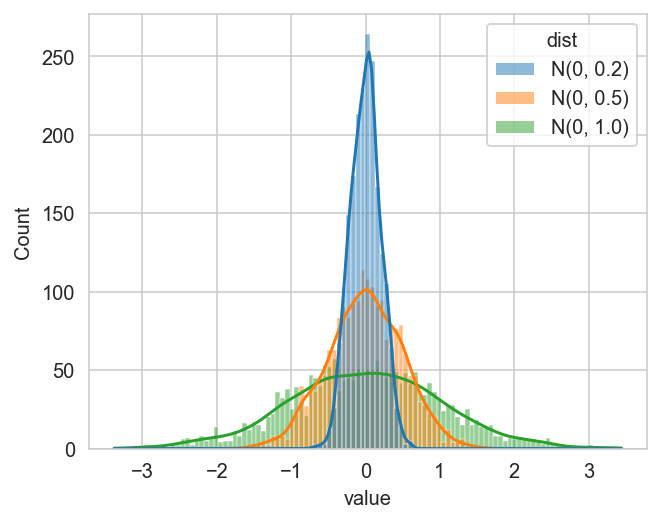

In [10]:
N = 2000
df = pd.concat(
    [
        pd.DataFrame(
            {"value": pm.draw(pm.Normal.dist(0, 0.2), N), "dist": "N(0, 0.2)"}
        ),
        pd.DataFrame(
            {"value": pm.draw(pm.Normal.dist(0, 0.5), N), "dist": "N(0, 0.5)"}
        ),
        pd.DataFrame({"value": pm.draw(pm.Normal.dist(0, 1), N), "dist": "N(0, 1.0)"}),
    ]
).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(5, 4))
sns.histplot(data=df, x="value", hue="dist", ax=ax, kde=True)
plt.show()

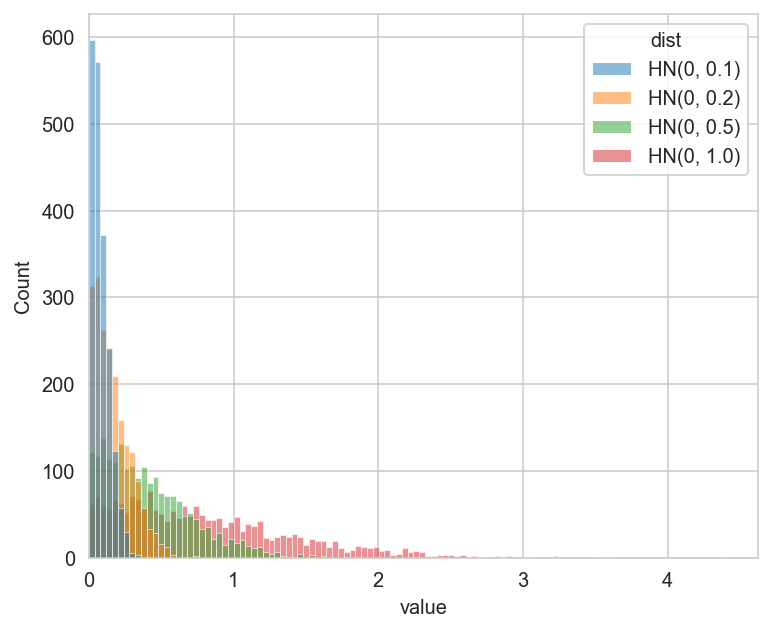

In [11]:
N = 2000


def _hn(sigma: float) -> pd.DataFrame:
    return pd.DataFrame(
        {
            "value": pm.draw(pm.HalfNormal.dist(sigma=sigma), N),
            "dist": f"HN(0, {sigma})",
        }
    )


df = pd.concat([_hn(s) for s in [0.1, 0.2, 0.5, 1.0]]).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(6, 5))
sns.histplot(data=df, x="value", hue="dist", ax=ax, kde=False)
ax.set_xlim(0, None)
plt.show()

In [12]:
df.groupby("dist").describe()

value                                                    \
             count      mean       std       min       25%       50%   
dist                                                                   
HN(0, 0.1)  2000.0  0.080161  0.060702  0.000063  0.033607  0.066828   
HN(0, 0.2)  2000.0  0.162718  0.123182  0.000160  0.064127  0.139831   
HN(0, 0.5)  2000.0  0.406164  0.305111  0.000417  0.163468  0.348269   
HN(0, 1.0)  2000.0  0.795054  0.602840  0.000103  0.329332  0.677567   

                                
                 75%       max  
dist                            
HN(0, 0.1)  0.114782  0.429192  
HN(0, 0.2)  0.238404  0.739642  
HN(0, 0.5)  0.580013  1.844951  
HN(0, 1.0)  1.140364  4.406250

(0.0, 101.85)

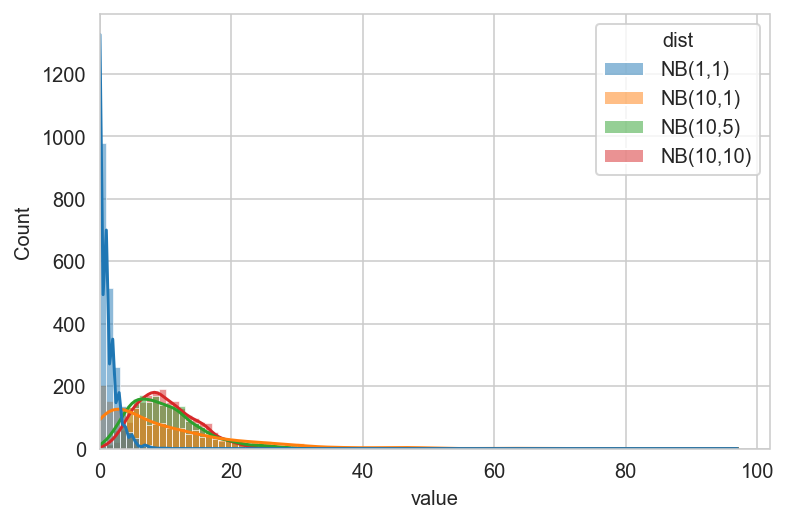

In [13]:
N = 2000
df = pd.DataFrame()
df = pd.concat(
    [
        df,
        pd.DataFrame(
            {"value": pm.draw(pm.NegativeBinomial.dist(1, 1), N), "dist": "NB(1,1)"}
        ),
        pd.DataFrame(
            {"value": pm.draw(pm.NegativeBinomial.dist(10, 1), N), "dist": "NB(10,1)"}
        ),
        pd.DataFrame(
            {"value": pm.draw(pm.NegativeBinomial.dist(10, 5), N), "dist": "NB(10,5)"}
        ),
        pd.DataFrame(
            {
                "value": pm.draw(pm.NegativeBinomial.dist(10, 10), N),
                "dist": "NB(10,10)",
            }
        ),
    ]
)
df = df.reset_index(drop=True)
ax = sns.histplot(data=df, x="value", hue="dist", kde=True, binwidth=1)
ax.set_xlim(0, None)

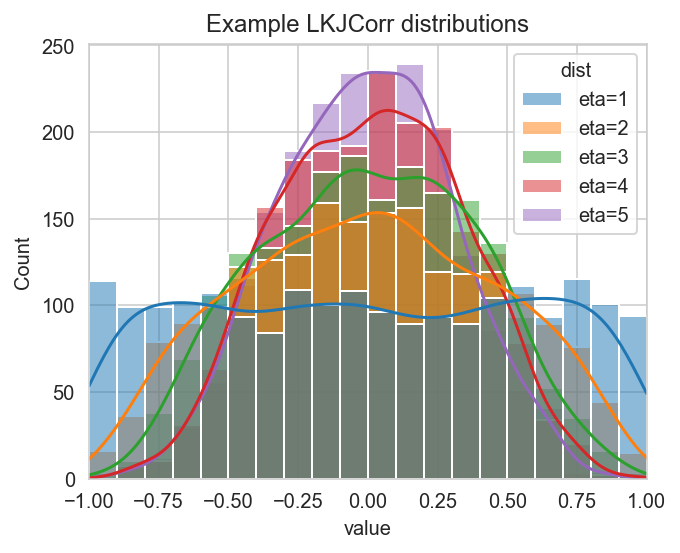

In [14]:
N = 2000


def _lkj(eta: int) -> pd.DataFrame:
    return pd.DataFrame(
        {
            "value": pm.draw(pm.LKJCorr.dist(n=2, eta=eta), N).flatten(),
            "dist": f"eta={eta}",
        }
    )


df = pd.concat([_lkj(i) for i in range(1, 6)]).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(5, 4))
sns.histplot(data=df, x="value", hue="dist", kde=True, binwidth=0.1, ax=ax)
ax.set_xlim(-1, 1)
ax.set_title("Example LKJCorr distributions")
plt.show()

In [15]:
df.groupby("dist").describe()

value                                                              \
        count      mean       std       min       25%       50%       75%   
dist                                                                        
eta=1  2000.0 -0.004073  0.583182 -0.999269 -0.521883 -0.017886  0.512324   
eta=2  2000.0  0.001007  0.453277 -0.972660 -0.343626 -0.000968  0.348912   
eta=3  2000.0  0.002012  0.382143 -0.964944 -0.289725  0.003653  0.296475   
eta=4  2000.0  0.012468  0.327537 -0.884178 -0.229669  0.019025  0.255508   
eta=5  2000.0 -0.008338  0.306484 -0.894606 -0.231391 -0.004932  0.206752   

                 
            max  
dist             
eta=1  0.999830  
eta=2  0.996988  
eta=3  0.964445  
eta=4  0.923625  
eta=5  0.868661

## Modeling

In [29]:
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel

[autoreload of speclet.bayesian_models.lineage_hierarchical_nb failed: Traceback (most recent call last):
  File "/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 480, in superreload
    update_generic(old_obj, new_obj)
  File "/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 377, in update_generic
    update(a, b)
  File "/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 345, in update_class
    update_instances(old, new)
  File "/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 303, in update_instances
    ref.__class__ = new
  File "pyda

In [30]:
crc_model = LineageHierNegBinomModel(
    lineage="colorectal", reduce_deterministic_vars=False
)
valid_crc_data = crc_model.data_processing_pipeline(crc_data.copy())
model_crc_data = crc_model.make_data_structure(valid_crc_data.copy())

[INFO] 2022-08-07 09:01:54 [(lineage_hierarchical_nb.py:data_processing_pipeline:287] Processing data for modeling.
[INFO] 2022-08-07 09:01:54 [(lineage_hierarchical_nb.py:data_processing_pipeline:288] LFC limits: (-5.0, 5.0)
[WARNING] 2022-08-07 09:01:55 [(lineage_hierarchical_nb.py:data_processing_pipeline:339] number of data points dropped: 0
[INFO] 2022-08-07 09:01:55 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:536] number of genes mutated in all cells lines: 1
[DEBUG] 2022-08-07 09:01:55 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:539] Genes always mutated: APC
[DEBUG] 2022-08-07 09:01:55 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:68] all_mut: {}
[INFO] 2022-08-07 09:01:55 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:77] Dropping 2 cancer genes.
[DEBUG] 2022-08-07 09:01:55 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:79] Dropped cancer genes: ['APC', 'MDM2']


In [31]:
model_crc_data.coords["cancer_gene"]

['FBXW7', 'KRAS', 'PIK3CA']

In [32]:
m = model_crc_data.comutation_matrix
m.min(axis=0), m.max(axis=0)

(array([-0.77077619, -0.9938461 , -0.77077619]),
 array([1.29739347, 1.00619201, 1.29739347]))

[INFO] 2022-08-07 09:01:58 [(lineage_hierarchical_nb.py:data_processing_pipeline:287] Processing data for modeling.
[INFO] 2022-08-07 09:01:58 [(lineage_hierarchical_nb.py:data_processing_pipeline:288] LFC limits: (-5.0, 5.0)
[WARNING] 2022-08-07 09:01:59 [(lineage_hierarchical_nb.py:data_processing_pipeline:339] number of data points dropped: 0
[INFO] 2022-08-07 09:01:59 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:536] number of genes mutated in all cells lines: 1
[DEBUG] 2022-08-07 09:01:59 [(lineage_hierarchical_nb.py:target_gene_is_mutated_vector:539] Genes always mutated: APC
[DEBUG] 2022-08-07 09:01:59 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:68] all_mut: {}
[INFO] 2022-08-07 09:01:59 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:77] Dropping 2 cancer genes.
[DEBUG] 2022-08-07 09:01:59 [(cancer_gene_mutation_matrix.py:_trim_cancer_genes:79] Dropped cancer genes: ['APC', 'MDM2']
[INFO] 2022-08-07 09:02:00 [(lineage_hierarchical_nb.py:_pre_model_mess

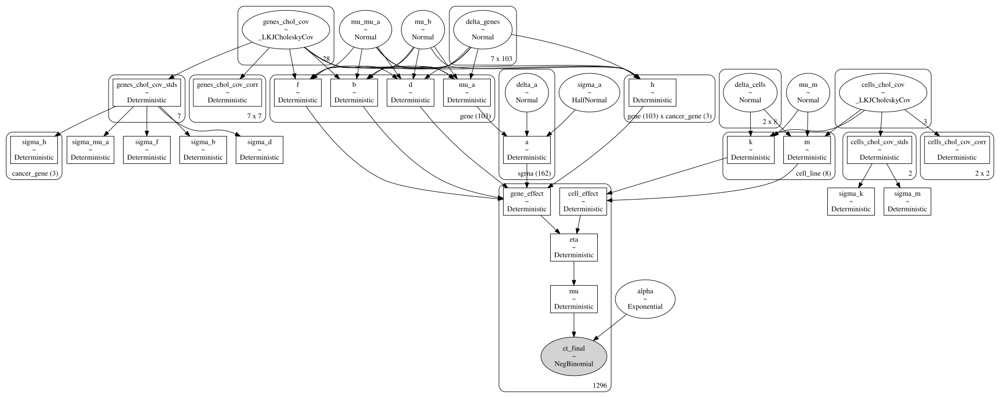

In [33]:
crc_pymc_model = crc_model.pymc_model(crispr_data_manager.data.copy())
pm.model_to_graphviz(crc_pymc_model)

In [34]:
with crc_pymc_model:
    pm_prior_pred = pm.sample_prior_predictive(
        var_names=["eta", "ct_final", "mu_a", "gene_effect"], random_seed=SEED
    )

print("prior predictive distribution")
pm_pred_draws = pm_prior_pred.prior_predictive["ct_final"].values.squeeze()
for q in [0, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99, 1]:
    res = np.quantile(pm_pred_draws, q=q)
    print(f"  {int(q*100)}%: {int(res):0,d}")

print("")
obs = valid_crc_data["counts_final"].astype(int)
print(f"final counts\n  min: {np.min(obs):,d},  max: {np.max(obs):,d}")

obs = valid_crc_data["counts_initial_adj"].astype(int)
print(f"initial counts\n  min: {np.min(obs):,d},  max: {np.max(obs):,d}")

prior predictive distribution
  0%: 0
  1%: 0
  10%: 7
  20%: 42
  30%: 98
  40%: 181
  50%: 304
  60%: 493
  70%: 811
  80%: 1,433
  90%: 3,176
  99%: 25,592
  100%: 46,583,789

final counts
  min: 0,  max: 9,819
initial counts
  min: 57,  max: 4,741


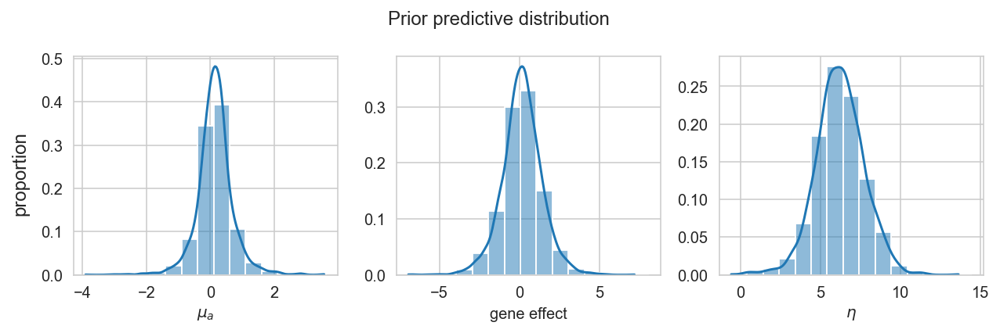

In [35]:
eta_prior = np.random.choice(pm_prior_pred.prior["eta"].values.flatten(), 2000)
ge_prior = np.random.choice(pm_prior_pred.prior["gene_effect"].values.flatten(), 4000)
mu_prior = np.random.choice(pm_prior_pred.prior["mu_a"].values.flatten(), 4000)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3))
sns.histplot(mu_prior, kde=True, ax=axes[0], binwidth=0.5, stat="proportion")
sns.histplot(ge_prior, kde=True, ax=axes[1], binwidth=1, stat="proportion")
sns.histplot(eta_prior, kde=True, ax=axes[2], binwidth=1, stat="proportion")
axes[0].set_xlabel(r"$\mu_a$")
axes[1].set_xlabel(r"gene effect")
axes[2].set_xlabel(r"$\eta$")

for ax in axes.flatten():
    ax.set_ylabel(None)
    ax.set_title(None)

fig.supylabel("proportion")
fig.suptitle("Prior predictive distribution")
fig.tight_layout()
plt.show()

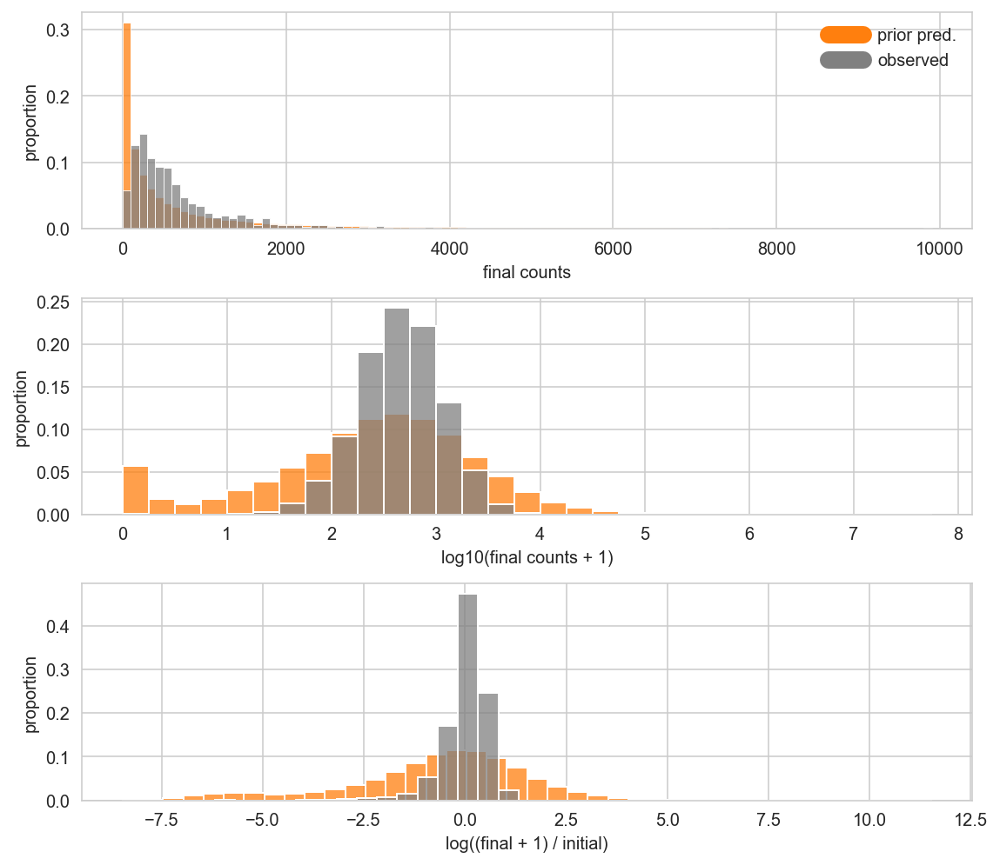

In [36]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 7))

stat = "proportion"

obs_max = crc_data["counts_final"].max()
truncated_prior_preds = [x for x in pm_pred_draws.flatten() if x <= obs_max]

prior_pred_pal = {"prior pred.": "tab:orange", "observed": "gray"}

# Untransformed
bw: float = 100
sns.histplot(
    x=truncated_prior_preds,
    ax=axes[0],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["prior pred."],
)
sns.histplot(
    x=valid_crc_data["counts_final"],
    ax=axes[0],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["observed"],
)
# Log10 transformed
bw = 0.25
sns.histplot(
    x=np.log10(pm_pred_draws.flatten() + 1),
    ax=axes[1],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["prior pred."],
)
sns.histplot(
    x=np.log10(valid_crc_data["counts_final"] + 1),
    ax=axes[1],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["observed"],
)
# Log-fold change
pp_lfc = np.log(
    (pm_pred_draws + 1) / (valid_crc_data["counts_initial_adj"].values[None, :])
)
obs_lfc = np.log(
    (valid_crc_data["counts_final"] + 1) / valid_crc_data["counts_initial_adj"]
)
bw = 0.5
sns.histplot(
    x=pp_lfc.flatten(),
    ax=axes[2],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["prior pred."],
)
sns.histplot(
    x=obs_lfc,
    ax=axes[2],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["observed"],
)


axes[0].set_xlabel("final counts")
axes[1].set_xlabel("log10(final counts + 1)")
axes[2].set_xlabel("log((final + 1) / initial)")

prior_pred_leg_handles = [
    Line2D([0], [0], linewidth=10, color=v, label=k) for k, v in prior_pred_pal.items()
]
axes[0].legend(handles=prior_pred_leg_handles, loc="upper right", frameon=False)

for ax in axes.flatten():
    ax.set_ylabel(stat)

plt.tight_layout()
plt.show()

## Sampling

In [37]:
with crc_pymc_model:
    trace = pymc.sampling_jax.sample_numpyro_nuts(
        draws=500,
        tune=1000,
        target_accept=0.90,
        random_seed=SEED,
        idata_kwargs={"log_likelihood": False},
        nuts_kwargs={"step_size": 0.1, "max_tree_depth": 12}
        # discard_tuned_samples=False,
    )
    pm.sample_posterior_predictive(trace, extend_inferencedata=True, random_seed=SEED)

Compiling...
Compilation time =  0:00:23.104257
Sampling...


  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

Sampling time =  0:02:25.782463
Transforming variables...
Transformation time =  0:00:05.376335


In [38]:
saved_warmup = hasattr(trace, "warmup_sample_stats")

## Posterior analysis

date created: 2022-08-07 13:05
sampled 4 chains with (unknown) tuning steps and 500 draws
num. divergences: 0, 0, 0, 0
percent divergences: 0.0, 0.0, 0.0, 0.0
BFMI: 0.738, 0.736, 0.737, 0.727
avg. step size: 0.08, 0.074, 0.107, 0.091
avg. accept prob.: 0.87, 0.932, 0.849, 0.868
avg. tree depth: 6.0, 6.0, 5.002, 6.0


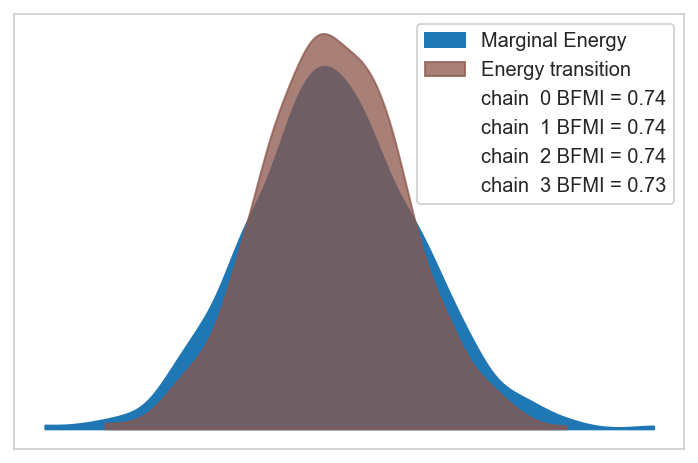

In [68]:
describe_mcmc(trace);

In [69]:
if saved_warmup:
    ar = trace.warmup_sample_stats.acceptance_rate.values
    ss = trace.warmup_sample_stats.step_size.values
    n_chains = ss.shape[0]
    x = np.arange(ss.shape[1])
    fig, axes = plt.subplots(n_chains // 2, 2, figsize=(8, 4), sharex=True, sharey=True)
    for c, ax in enumerate(axes.flatten()):
        sns.scatterplot(x=x, y=ar[c, :], color="tab:blue", edgecolor=None, s=2, ax=ax)
        sns.scatterplot(x=x, y=ss[c, :], color="tab:green", edgecolor=None, s=2, ax=ax)

    fig.tight_layout()
    plt.show()

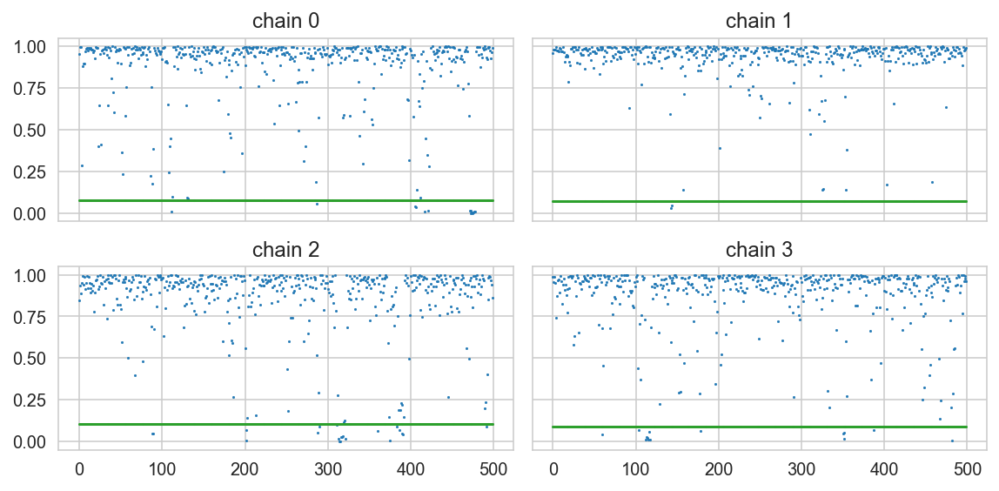

In [70]:
ar = trace.sample_stats.acceptance_rate.values
ss = trace.sample_stats.step_size.values
n_chains = ss.shape[0]
x = np.arange(ss.shape[1])
fig, axes = plt.subplots(n_chains // 2, 2, figsize=(8, 4), sharex=True, sharey=True)
for c, ax in enumerate(axes.flatten()):
    sns.scatterplot(x=x, y=ar[c, :], color="tab:blue", edgecolor=None, s=2, ax=ax)
    sns.scatterplot(x=x, y=ss[c, :], color="tab:green", edgecolor=None, s=2, ax=ax)
    ax.set_title(f"chain {c}")

fig.tight_layout()
plt.show()

In [76]:
stat_cats = ["energy", "step_size", "n_steps", "acceptance_rate", "tree_depth"]
trace.sample_stats.get(stat_cats).to_dataframe().groupby("chain").mean().round(3)

,energy,step_size,n_steps,acceptance_rate,tree_depth
chain,,,,,
0,10201.482,0.080,63.000,0.870,6.000
1,10192.476,0.074,63.000,0.932,6.000
2,10204.631,0.107,31.064,0.849,5.002
3,10201.173,0.091,63.000,0.868,6.000


In [72]:
if saved_warmup:
    print(trace.warmup_posterior["sigma_mu_a"].values[:, 0:5])

In [73]:
if saved_warmup:
    az.plot_trace(
        trace.warmup_posterior,
        var_names=crc_model.vars_regex() + ["~^h$"],
        filter_vars="regex",
        coords={"draw": list(range(100))},
    )
    plt.tight_layout()
    plt.show()

In [74]:
if saved_warmup:
    az.plot_trace(
        trace.warmup_posterior,
        var_names=crc_model.vars_regex() + ["~^h$"],
        filter_vars="regex",
    )
    plt.tight_layout()
    plt.show()

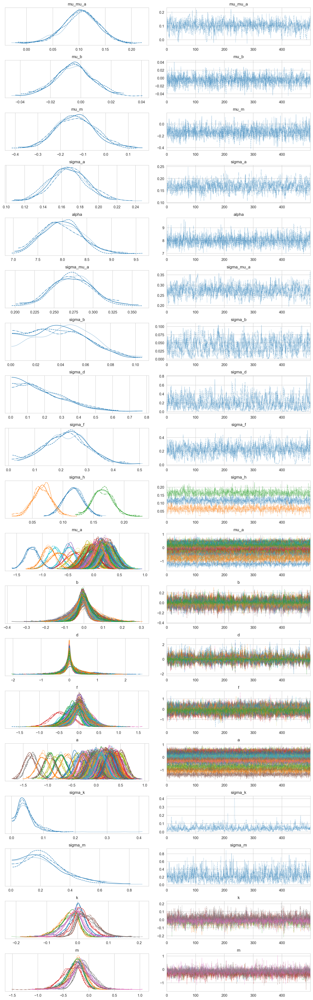

In [75]:
az.plot_trace(trace, var_names=crc_model.vars_regex() + ["~^h$"], filter_vars="regex")
plt.tight_layout();

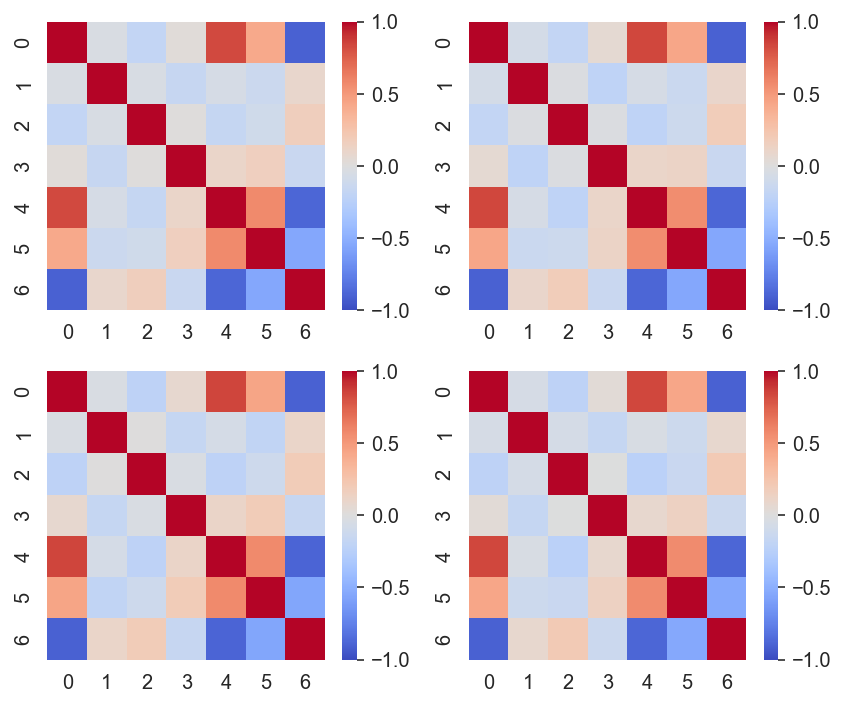

In [77]:
n_chains = len(trace.posterior.coords["chain"])
fig, axes = plt.subplots(2, 2, figsize=(6, 5))
for c, ax in enumerate(axes.flatten()):
    cor_mat = trace.posterior["genes_chol_cov_corr"][c, :, :, :].mean(axis=(0))
    sns.heatmap(cor_mat, vmin=-1, vmax=1, cmap="coolwarm", ax=ax)

fig.tight_layout()
plt.show()

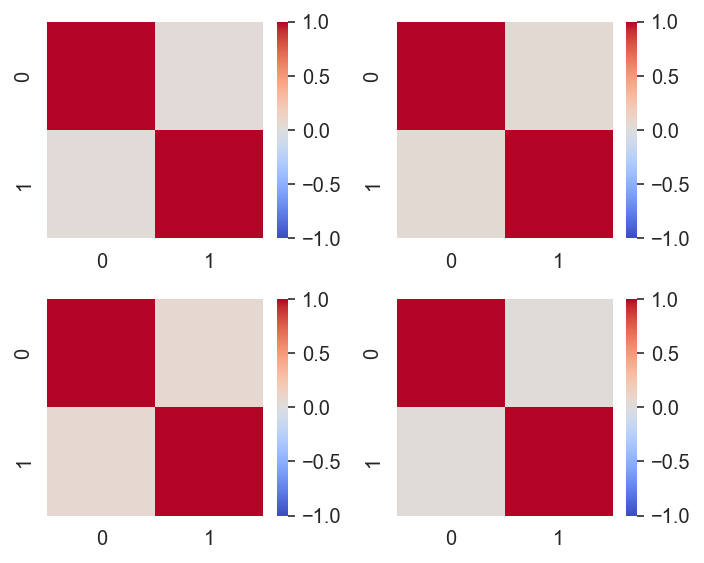

In [78]:
n_chains = len(trace.posterior.coords["chain"])
fig, axes = plt.subplots(2, 2, figsize=(5, 4))
for c, ax in enumerate(axes.flatten()):
    cor_mat = trace.posterior["cells_chol_cov_corr"][c, :, :, :].mean(axis=(0))
    sns.heatmap(cor_mat, vmin=-1, vmax=1, cmap="coolwarm", ax=ax)

fig.tight_layout()
plt.show()

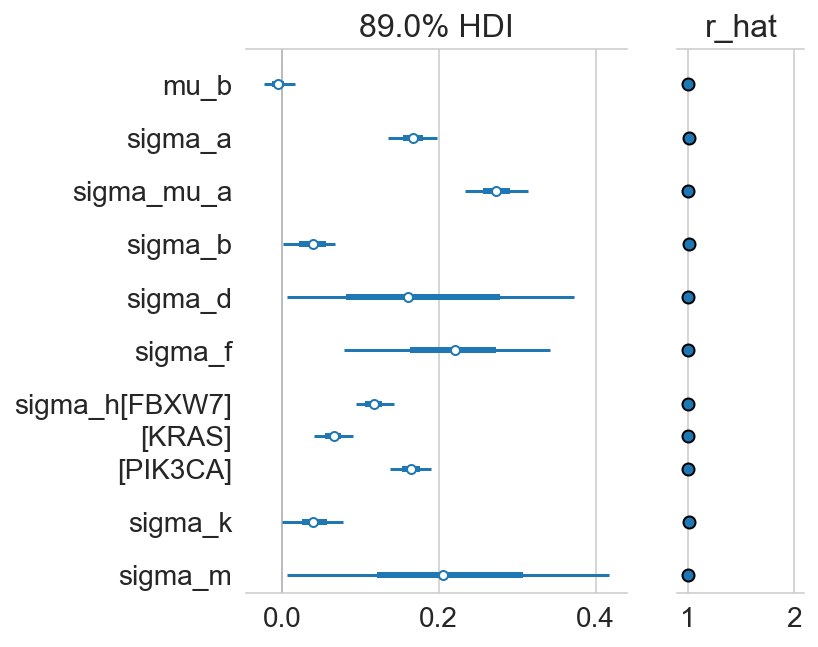

In [79]:
axes = az.plot_forest(
    trace,
    var_names=["mu_b", "mu_d", "mu_f", "mu_h", "^sigma.*$"],
    filter_vars="regex",
    combined=True,
    figsize=(5, 5),
    r_hat=True,
)
line = axes[0].axvline(color="k", alpha=0.5, linewidth=1)
line.set_zorder(0)
plt.show()

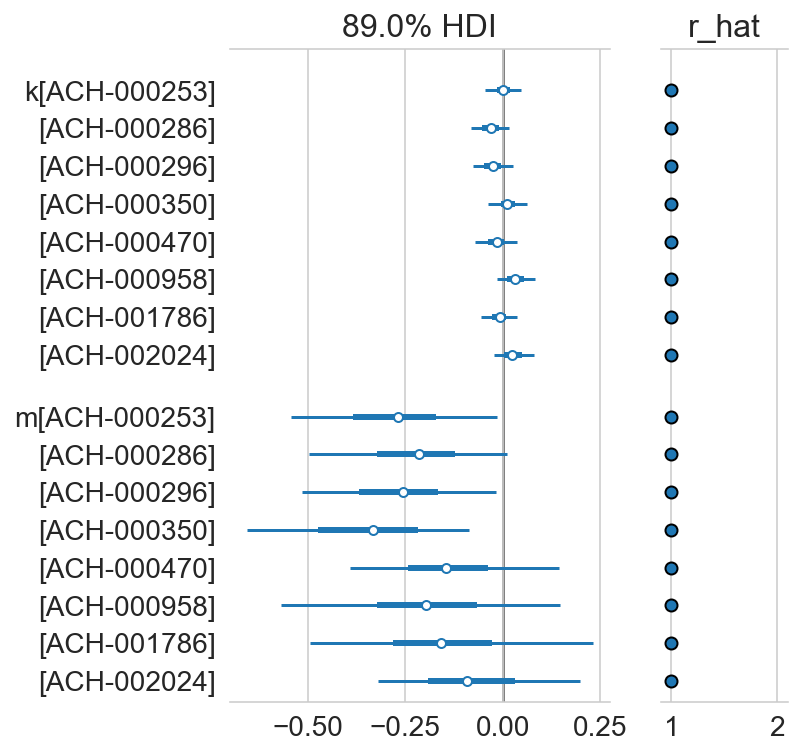

In [80]:
axes = az.plot_forest(
    trace, var_names=["k", "m"], combined=True, r_hat=True, figsize=(5, 6)
)
line = axes[0].axvline(color="gray")
line.set_zorder(0)
plt.show()

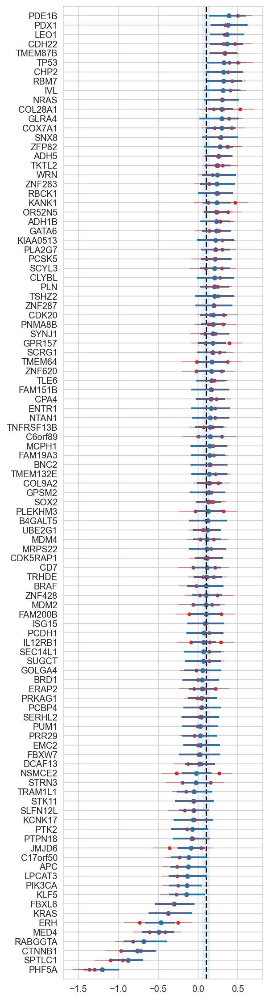

In [81]:
gene_order = (
    az.summary(trace, var_names=["mu_a"], kind="stats")
    .pipe(extract_coords_param_names, names=["hugo_symbol"])
    .sort_values("mean")["hugo_symbol"]
    .tolist()
)

sgrna_to_gene_map = (
    crc_data[["hugo_symbol", "sgrna"]].drop_duplicates().reset_index(drop=True)
)
a_post = (
    az.summary(trace, var_names=["a"], kind="stats")
    .pipe(extract_coords_param_names, names=["sgrna"])
    .reset_index(drop=True)
    .merge(sgrna_to_gene_map, on="sgrna", validate="one_to_one")
)
mu_a_post = (
    az.summary(trace, var_names=["mu_a"], kind="stats")
    .pipe(extract_coords_param_names, names=["hugo_symbol"])
    .reset_index(drop=True)
)

a_post["hugo_symbol"] = pd.Categorical(
    a_post["hugo_symbol"], categories=gene_order, ordered=True
)
a_post = a_post.sort_values("hugo_symbol").reset_index(drop=True)
mu_a_post["hugo_symbol"] = pd.Categorical(
    mu_a_post["hugo_symbol"], categories=gene_order, ordered=True
)
mu_a_post = mu_a_post.sort_values("hugo_symbol").reset_index(drop=True)

mu_mu_a_post = az.summary(trace, var_names=["mu_mu_a"], kind="stats")
assert len(mu_mu_a_post) == 1
mu_mu_a_avg = mu_mu_a_post["mean"][0]
mu_mu_a_hdi = (mu_mu_a_post["hdi_5.5%"][0], mu_mu_a_post["hdi_94.5%"][0])

fig, ax = plt.subplots(figsize=(4, 20))
# plt.axvline(0, color="grey")

# Population average and HDI
plt.fill_between(x=mu_mu_a_hdi, y1=-1, y2=len(mu_a_post), alpha=0.1)
plt.axvline(mu_mu_a_avg, color="k", linestyle="--")

# Gene estimates.
plt.hlines(
    y=mu_a_post["hugo_symbol"],
    xmin=mu_a_post["hdi_5.5%"],
    xmax=mu_a_post["hdi_94.5%"],
    color="tab:blue",
    linewidth=2,
)
plt.scatter(x=mu_a_post["mean"], y=mu_a_post["hugo_symbol"], s=20, c="tab:blue")

# sgRNA estimates.
plt.hlines(
    y=a_post["hugo_symbol"],
    xmin=a_post["hdi_5.5%"],
    xmax=a_post["hdi_94.5%"],
    color="tab:red",
    linewidth=1,
    alpha=0.5,
)
plt.scatter(x=a_post["mean"], y=a_post["hugo_symbol"], s=10, c="tab:red")

plt.ylim(-1, len(mu_a_post))
plt.show()

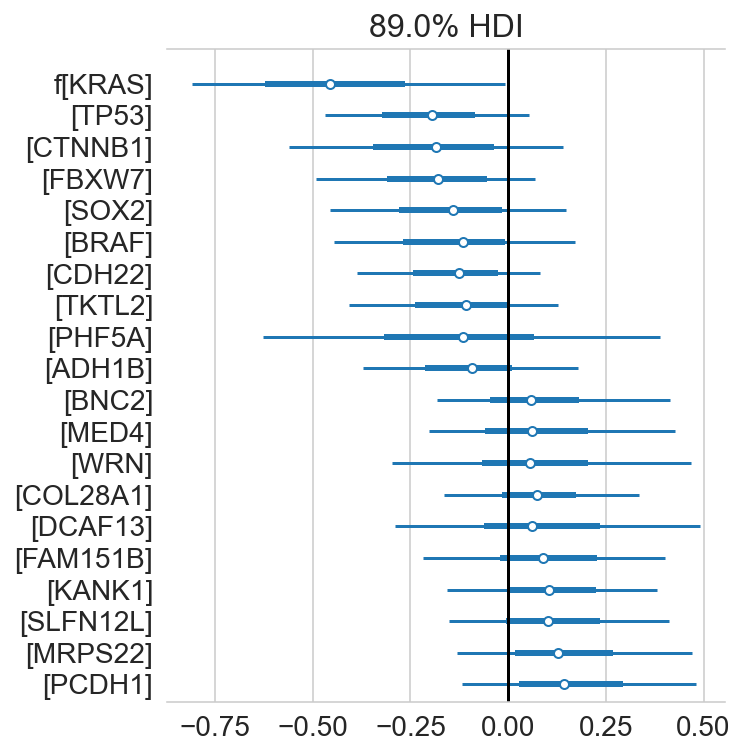

In [82]:
top_mut_effect_genes = (
    az.summary(trace, var_names=["f"])
    .sort_values("mean")
    .pipe(head_tail)
    .pipe(extract_coords_param_names, "hugo_symbol")["hugo_symbol"]
    .tolist()
)
ax = az.plot_forest(
    trace,
    var_names=["f"],
    coords={"gene": top_mut_effect_genes},
    combined=True,
    figsize=(5, 6),
)
ax[0].axvline(0, color="k")
plt.show()

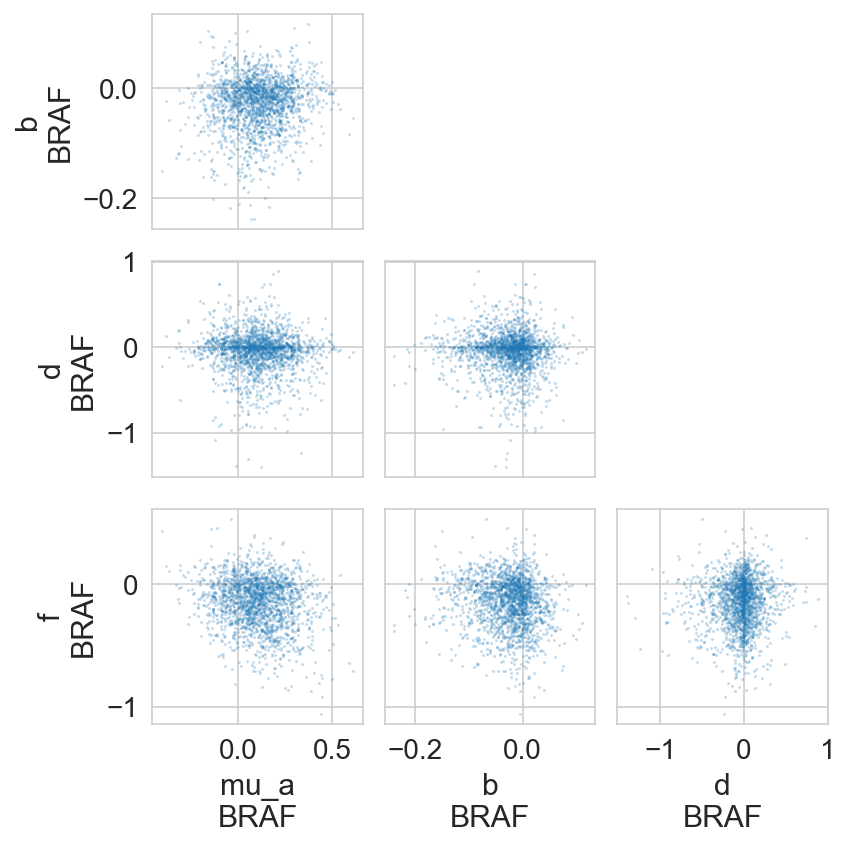

In [83]:
az.plot_pair(
    trace,
    var_names=["mu_a", "b", "d", "f"],
    coords={"gene": ["BRAF"]},
    scatter_kwargs={"alpha": 0.25, "markersize": 1},
    figsize=(6, 6),
)
plt.tight_layout()
plt.show()

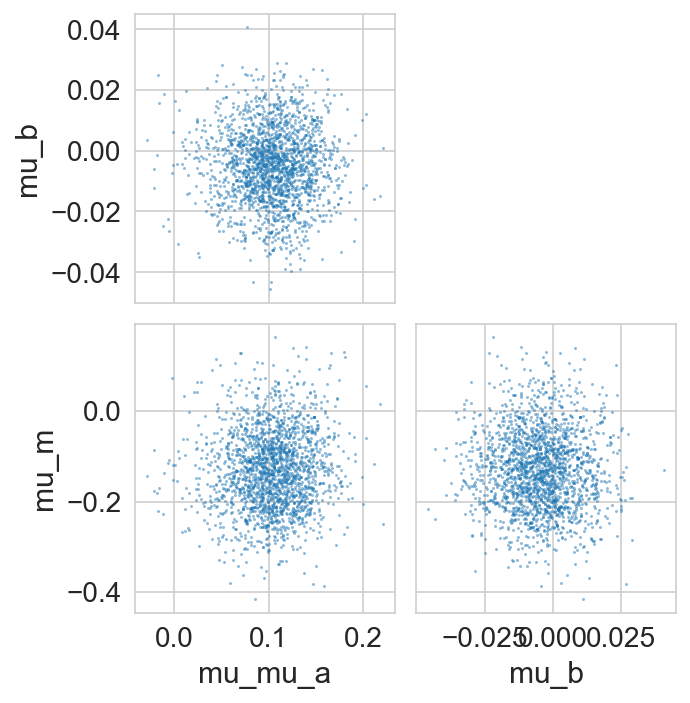

In [84]:
az.plot_pair(
    trace,
    var_names=["mu_mu_a", "mu_b", "mu_m"],
    scatter_kwargs={"alpha": 0.5, "markersize": 1},
    figsize=(5, 5),
)
plt.tight_layout()
plt.show()

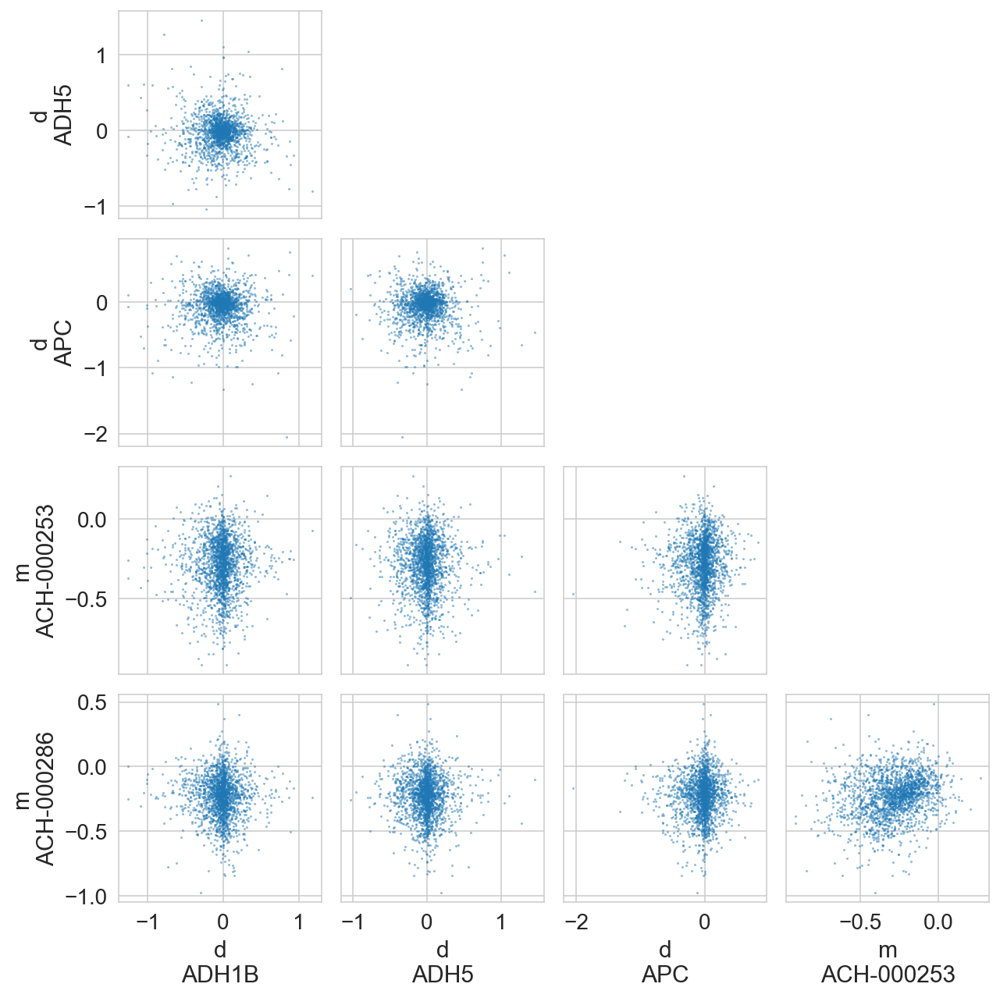

In [85]:
az.plot_pair(
    trace,
    var_names=["d", "m"],
    coords={
        "gene": crc_data["hugo_symbol"].cat.categories[:3],
        "cell_line": crc_data["depmap_id"].cat.categories[:2],
    },
    scatter_kwargs={"alpha": 0.5, "markersize": 1},
    figsize=(9, 9),
)
plt.tight_layout()
plt.show()

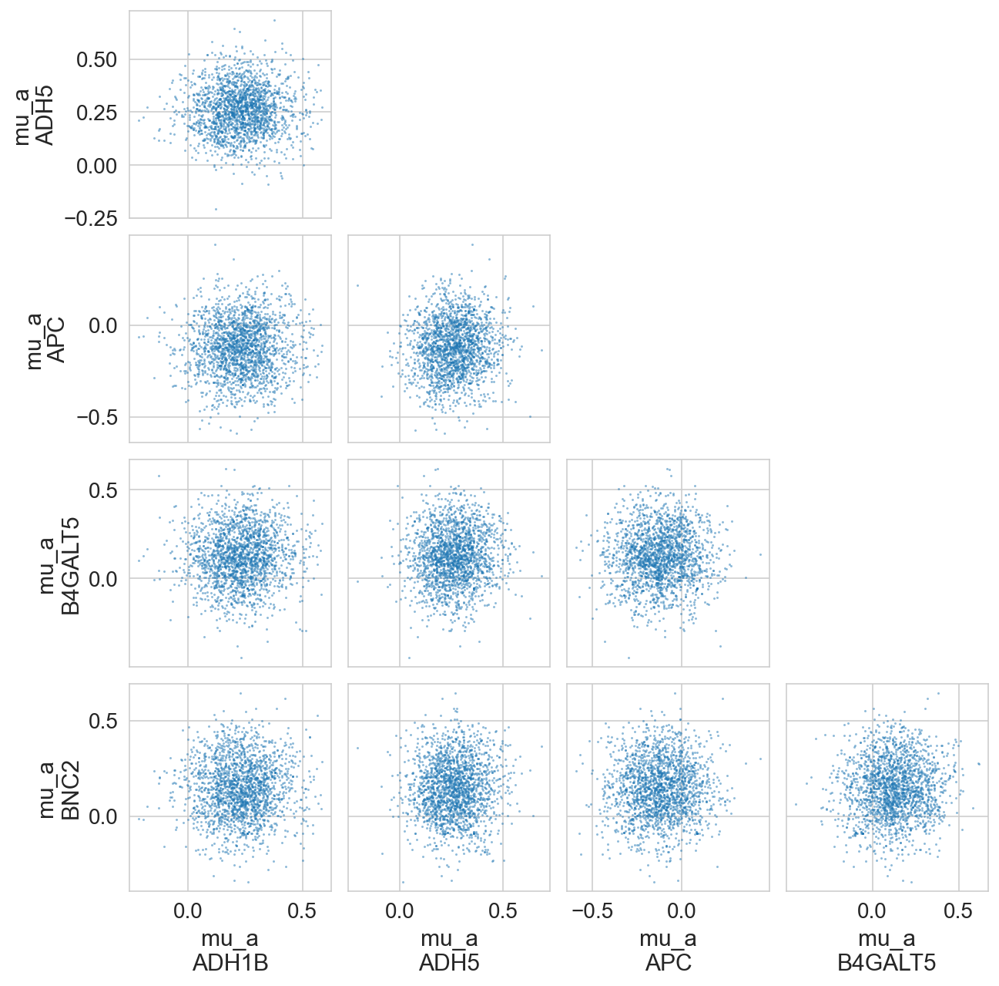

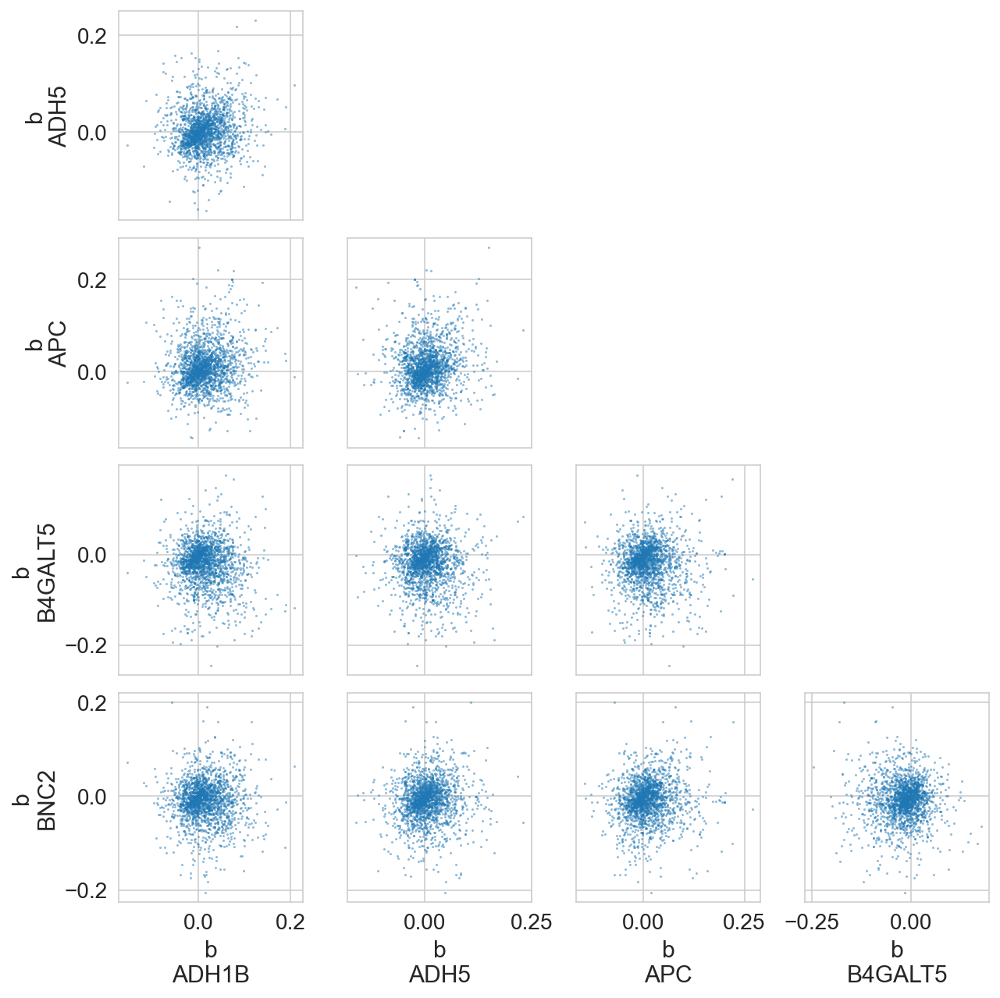

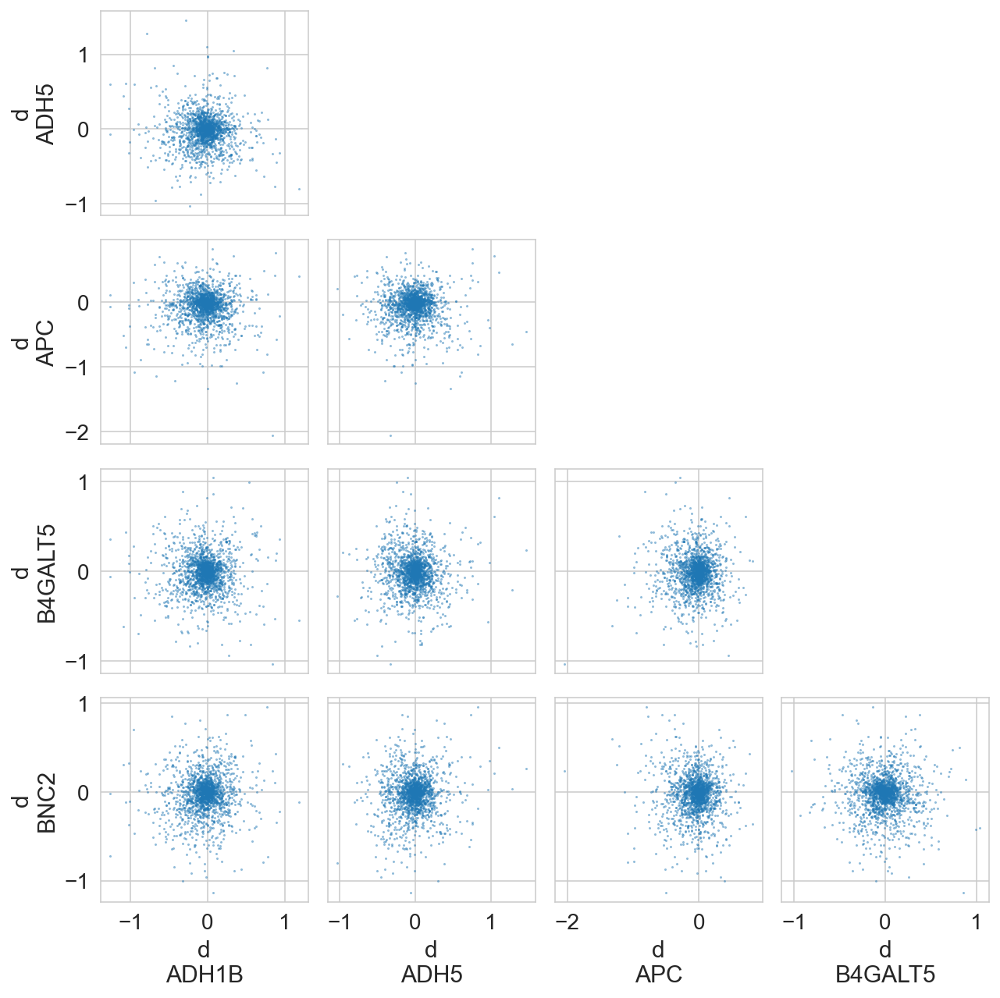

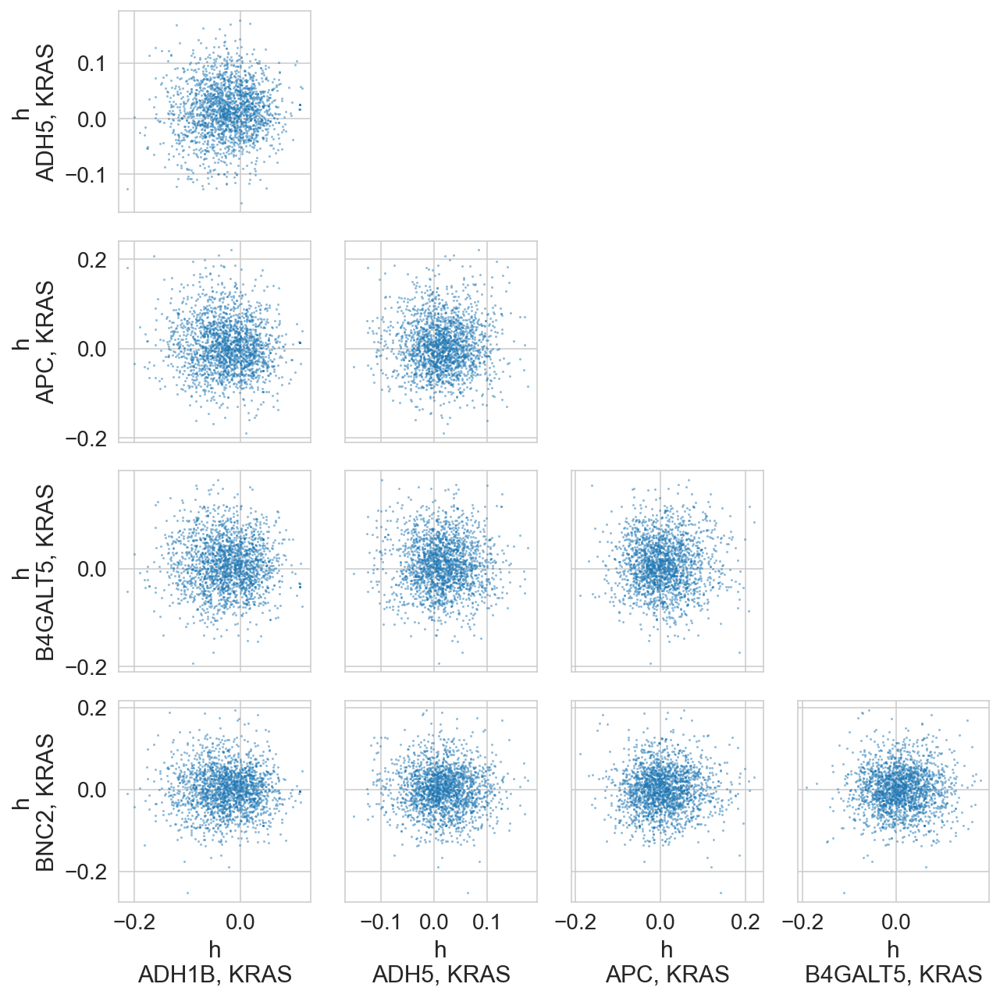

In [86]:
for var_name in ["mu_a", "b", "d", "h"]:
    az.plot_pair(
        trace,
        var_names=[var_name],
        coords={
            "gene": crc_data["hugo_symbol"].cat.categories[:5],
            "cancer_gene": ["KRAS"],
        },
        scatter_kwargs={"alpha": 0.5, "markersize": 1},
        figsize=(9, 9),
    )
    plt.tight_layout()
    plt.show()

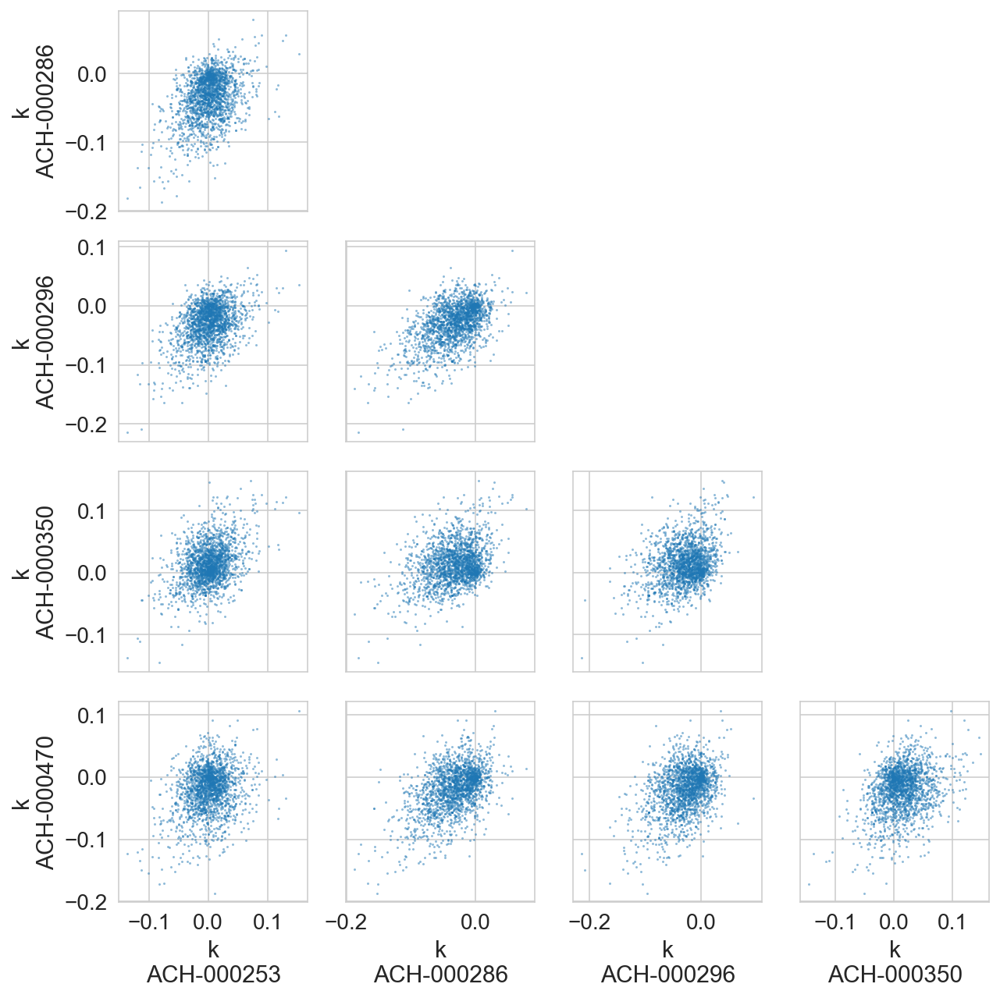

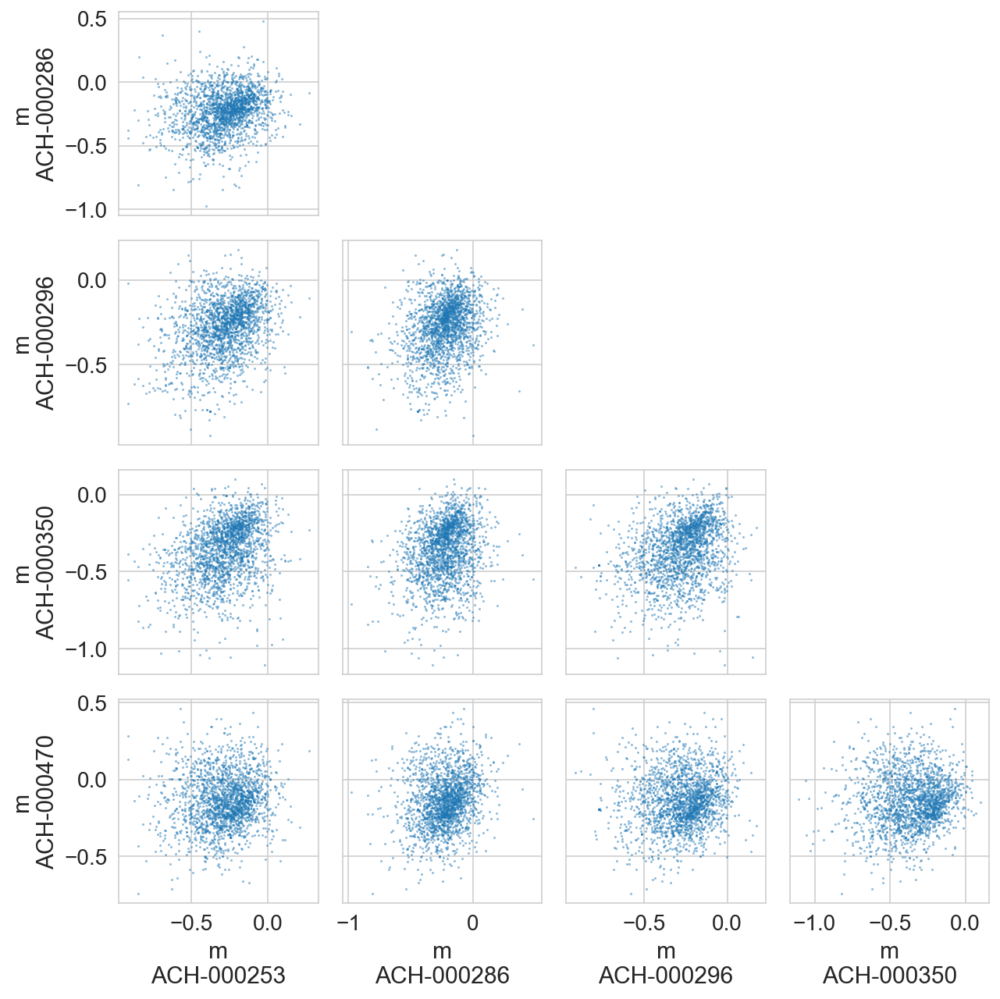

In [87]:
for var_name in ["k", "m"]:
    az.plot_pair(
        trace,
        var_names=[var_name],
        coords={
            "cell_line": crc_data["depmap_id"].cat.categories[:5],
        },
        scatter_kwargs={"alpha": 0.5, "markersize": 1},
        figsize=(9, 9),
    )
    plt.tight_layout()
    plt.show()

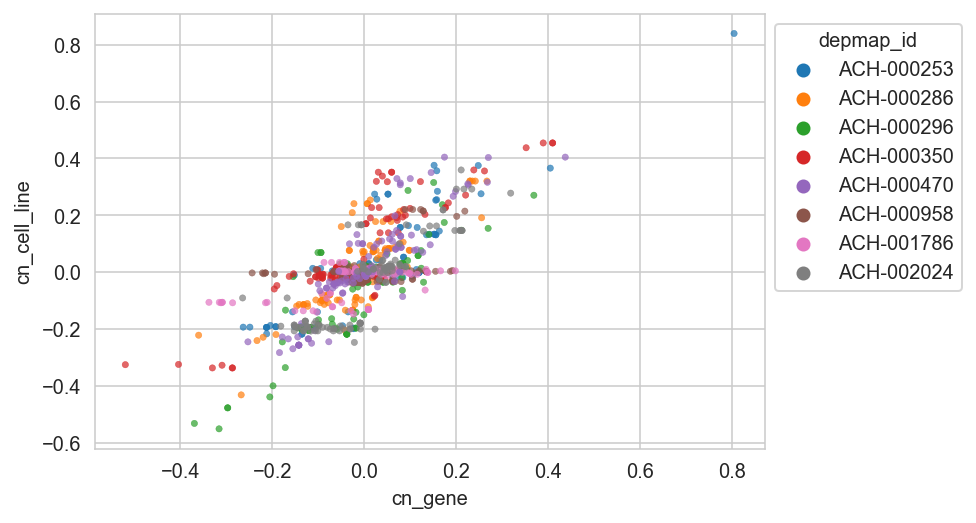

In [88]:
cn_data = valid_crc_data[
    ["hugo_symbol", "depmap_id", "cn_gene", "cn_cell_line"]
].drop_duplicates()
ax = sns.scatterplot(
    data=cn_data,
    x="cn_gene",
    y="cn_cell_line",
    hue="depmap_id",
    s=10,
    alpha=0.7,
    edgecolor=None,
)
sns.move_legend(ax, loc="upper left", bbox_to_anchor=(1, 1))
plt.show()

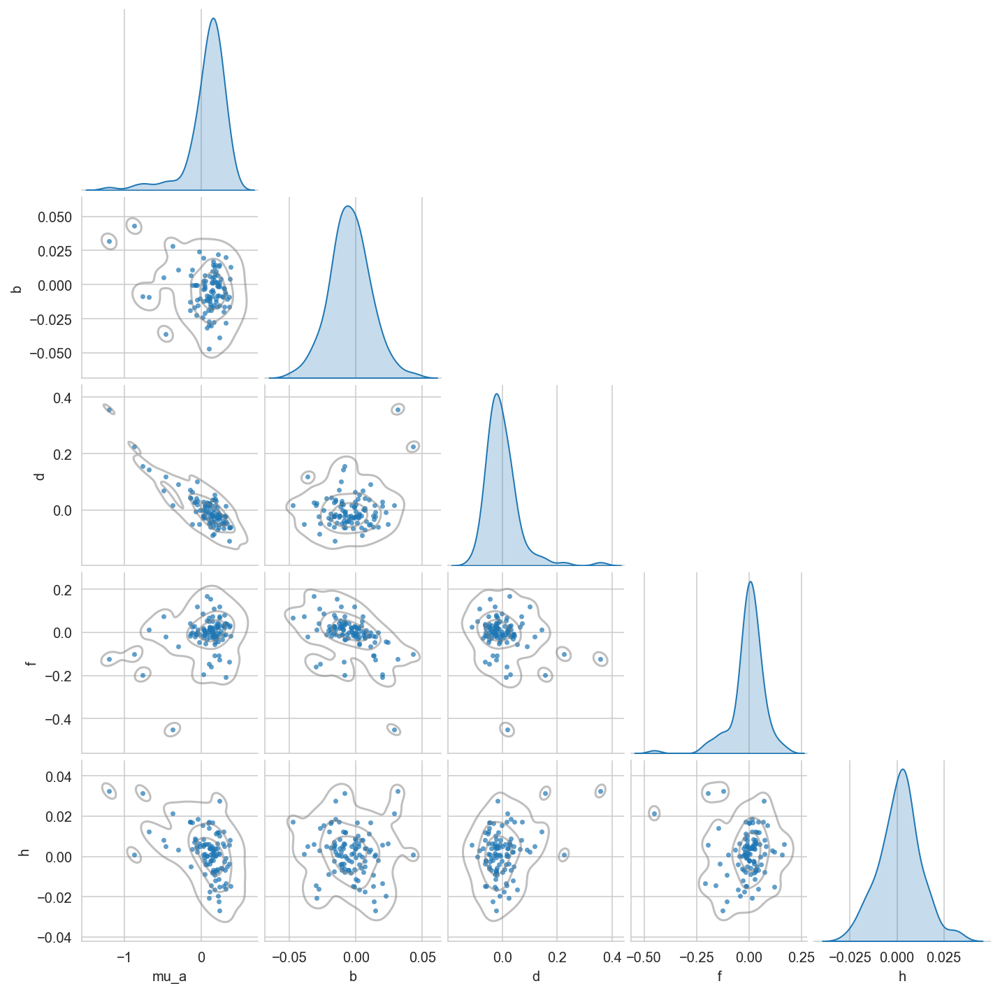

In [89]:
gene_effects = (
    trace.posterior.get(["mu_a", "b", "d", "f", "h"])
    .to_dataframe()
    .groupby(["gene"])
    .mean()
)
g = sns.pairplot(
    gene_effects,
    corner=True,
    diag_kind="kde",
    height=2,
    aspect=1,
    plot_kws={"edgecolor": None, "alpha": 0.7, "s": 10, "color": "tab:blue"},
)
g.map_lower(sns.kdeplot, levels=4, color="gray", alpha=0.5)
# g.map_lower(lambda *args, **kwargs: plt.gca().axhline(color="k", linewidth=0.7))
# g.map_lower(lambda *args, **kwargs: plt.gca().axvline(color="k", linewidth=0.7))
plt.show()

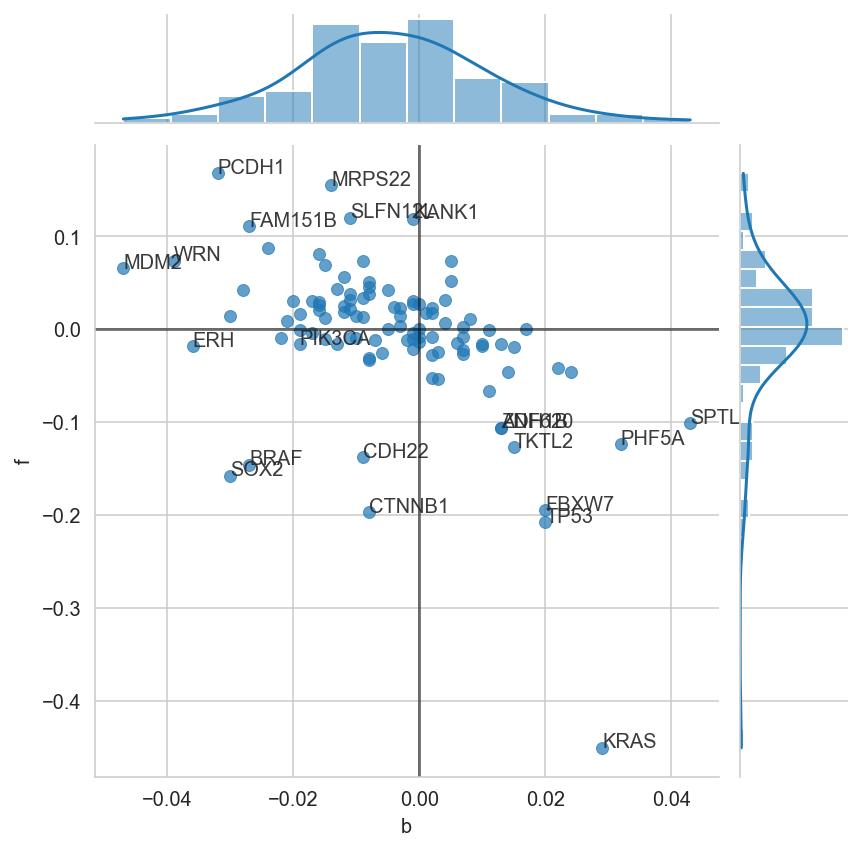

In [90]:
b_f_post = (
    az.summary(trace, var_names=["f", "b"])
    .pipe(extract_coords_param_names, names=["hugo_symbol"])
    .assign(var_name=lambda d: [x[0] for x in d.index.values])
    .pivot_wider("hugo_symbol", names_from="var_name", values_from="mean")
    .set_index("hugo_symbol")
)

jp = sns.jointplot(
    data=b_f_post,
    x="b",
    y="f",
    marginal_kws={"kde": True},
    joint_kws={"edgecolor": None, "alpha": 0.7},
)
ax = jp.ax_joint
ax.axhline(0, color="k", alpha=0.5)
ax.axvline(0, color="k", alpha=0.5)

genes_to_label = list(trace.posterior.coords["cancer_gene"].values)
genes_to_label += b_f_post[b_f_post["f"] < -0.1].index.tolist()
genes_to_label += b_f_post[b_f_post["f"] > 0.1].index.tolist()
genes_to_label += b_f_post[b_f_post["b"] < -0.03].index.tolist()
genes_to_label += b_f_post[b_f_post["b"] > 0.03].index.tolist()
genes_to_label = list(set(genes_to_label))
for gene in genes_to_label:
    data = b_f_post.query(f"hugo_symbol == '{gene}'")
    assert len(data) == 1
    ax.text(data["b"], data["f"], s=gene, alpha=0.9)


plt.show()

In [91]:
(
    valid_crc_data.filter_column_isin(
        "hugo_symbol", trace.posterior.coords["cancer_gene"].values
    )[["hugo_symbol", "depmap_id", "is_mutated"]]
    .drop_duplicates()
    .assign(is_mutated=lambda d: d["is_mutated"].map({True: "X", False: ""}))
    .pivot_wider("depmap_id", "hugo_symbol", "is_mutated")
    .set_index("depmap_id")
)

,KRAS,FBXW7,PIK3CA
depmap_id,,,
ACH-000253,,,
ACH-000286,X,,
ACH-000296,,,
ACH-000350,X,,
ACH-000470,X,X,
ACH-000958,,X,X
ACH-001786,,X,X
ACH-002024,X,,X


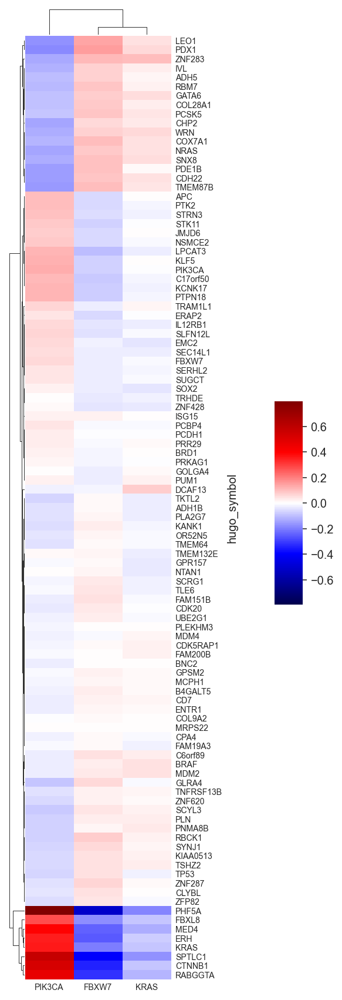

In [94]:
h_post_summary = (
    az.summary(trace, var_names="h", kind="stats")
    .pipe(extract_coords_param_names, names=["hugo_symbol", "cancer_gene"])
    .pivot_wider("hugo_symbol", names_from="cancer_gene", values_from="mean")
    .set_index("hugo_symbol")
)

vmax = np.abs(h_post_summary.values).max()

figsize = (3.3, 12)
dendro_ratio = (0.1, figsize[0] * 0.1 / figsize[1])
cm = sns.clustermap(
    h_post_summary,
    z_score=None,
    cmap="seismic",
    center=0,
    vmin=-vmax,
    vmax=vmax,
    figsize=figsize,
    dendrogram_ratio=dendro_ratio,
    cbar_pos=(1, 0.4, 0.1, 0.2),
    yticklabels=1,
)
cm.ax_heatmap.tick_params("both", labelsize=7, size=0)
plt.show()

In [95]:
cg_mut_labels = (
    valid_crc_data.filter_column_isin(
        "hugo_symbol", trace.posterior.coords["cancer_gene"].values
    )[["hugo_symbol", "depmap_id", "is_mutated"]]
    .drop_duplicates()
    .pivot_wider("depmap_id", "hugo_symbol", "is_mutated")
    .set_index("depmap_id")
)
_labels = []
for i in range(len(cg_mut_labels)):
    muts = cg_mut_labels.columns[cg_mut_labels.values[i, :]].tolist()
    if len(muts) == 0:
        _labels.append("WT")
    else:
        _labels.append(",".join(muts))

cg_mut_labels["mut_label"] = _labels
cg_mut_labels = cg_mut_labels[["mut_label"]].reset_index(drop=False)
cg_mut_labels

,depmap_id,mut_label
0,ACH-000253,WT
1,ACH-000286,KRAS
2,ACH-000296,WT
3,ACH-000350,KRAS
4,ACH-000470,"KRAS,FBXW7"
5,ACH-000958,"FBXW7,PIK3CA"
6,ACH-001786,"FBXW7,PIK3CA"
7,ACH-002024,"KRAS,PIK3CA"


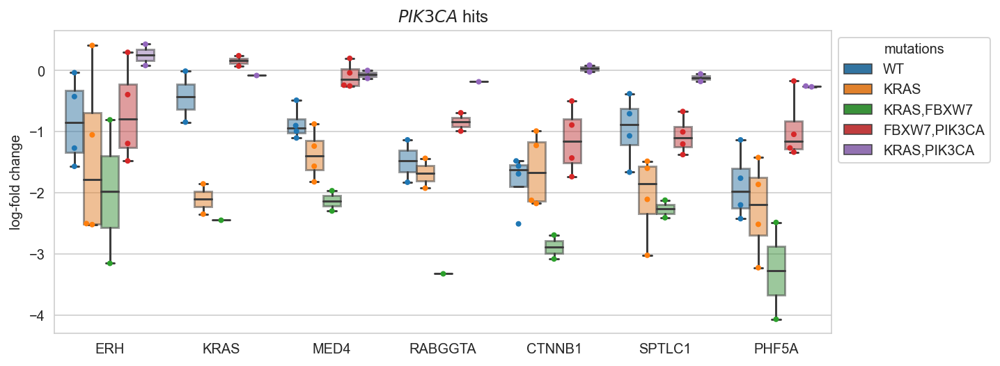

In [97]:
pik3ca_hits = h_post_summary.sort_values("PIK3CA").query("PIK3CA > 0.3").index.tolist()

pik3ca_hits_data = (
    crc_data.copy()
    .filter_column_isin("hugo_symbol", pik3ca_hits)
    .merge(cg_mut_labels, on="depmap_id")
    .reset_index(drop=True)
    .assign(
        hugo_symbol=lambda d: pd.Categorical(
            d["hugo_symbol"], categories=pik3ca_hits, ordered=True
        )
    )
)


fig, ax = plt.subplots(figsize=(10, 4))
sns.boxplot(
    data=pik3ca_hits_data,
    x="hugo_symbol",
    y="lfc",
    hue="mut_label",
    dodge=True,
    ax=ax,
    flierprops={"markersize": 0},
    boxprops={"alpha": 0.5},
)
sns.move_legend(ax, title="mutations", loc="upper left", bbox_to_anchor=(1, 1))
ax.add_artist(ax.get_legend())
sns.swarmplot(
    data=pik3ca_hits_data,
    x="hugo_symbol",
    y="lfc",
    hue="mut_label",
    dodge=True,
    ax=ax,
    s=4,
)

ax.set_title("$\mathit{PIK3CA}$ hits")
ax.set_xlabel(None)
ax.set_ylabel("log-fold change")
ax.get_legend().remove()

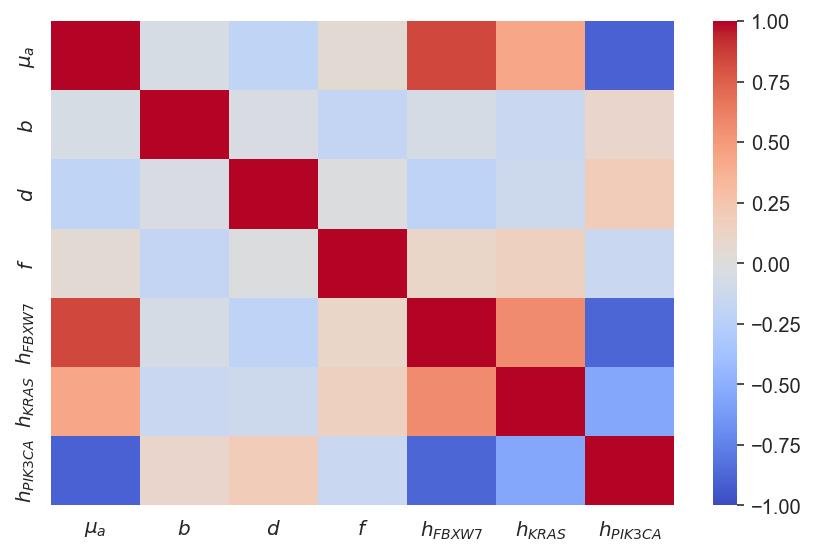

In [98]:
gene_vars = ["$\mu_a$", "$b$", "$d$", "$f$"]
gene_vars += ["$h_{" + g + "}$" for g in trace.posterior.coords["cancer_gene"].values]
gene_corr_post = (
    az.summary(trace, var_names=["genes_chol_cov_corr"], kind="stats")
    .pipe(extract_coords_param_names, names=["d0", "d1"])
    .astype({"d0": int, "d1": int})
    .assign(
        p0=lambda d: [gene_vars[i] for i in d["d0"]],
        p1=lambda d: [gene_vars[i] for i in d["d1"]],
    )
)

plot_df = gene_corr_post.pivot_wider(
    "p0", names_from="p1", values_from="mean"
).set_index("p0")
ax = sns.heatmap(plot_df, cmap="coolwarm", vmin=-1, vmax=1)
ax.set_xlabel(None)
ax.set_ylabel(None)
plt.tight_layout()
plt.show()

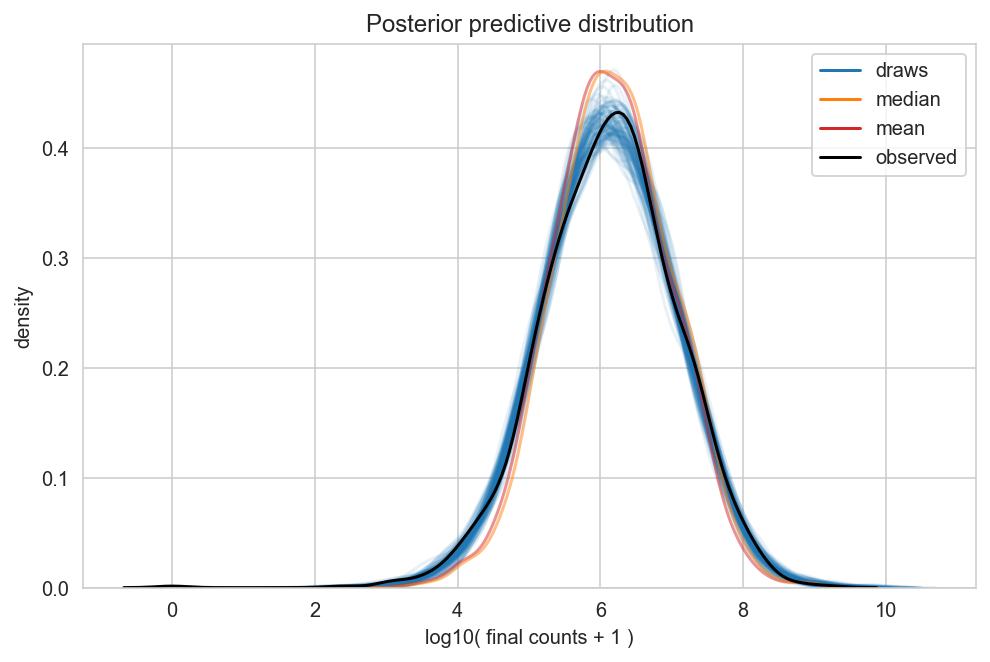

In [99]:
N = 100

pp_dist = trace.posterior_predictive["ct_final"]
n_chains, n_draws, n_samples = pp_dist.shape
draws_idx = np.random.choice(np.arange(n_draws), N // n_chains, replace=False)

fig, ax = plt.subplots(figsize=(8, 5))

ppc_pal = {
    "draws": "tab:blue",
    "median": "tab:orange",
    "mean": "tab:red",
    "observed": "black",
}

# Example draws.
for c, d in product(range(n_chains), draws_idx):
    values = np.log(pp_dist[c, d, :].values + 1)
    sns.kdeplot(values, color=ppc_pal["draws"], alpha=0.1, ax=ax)

# Average distributions.
pp_dist_mean = np.log(pp_dist.median(axis=(0, 1)) + 1)
pp_dist_mid = np.log(pp_dist.mean(axis=(0, 1)) + 1)
sns.kdeplot(pp_dist_mean, color=ppc_pal["mean"], ax=ax, alpha=0.5)
sns.kdeplot(pp_dist_mid, color=ppc_pal["median"], ax=ax, alpha=0.5)

# Observed distribution.
sns.kdeplot(
    np.log(trace.observed_data["ct_final"] + 1), ax=ax, color=ppc_pal["observed"]
)

ppc_leg_handles: list[Line2D] = []
for lbl, color in ppc_pal.items():
    ppc_leg_handles.append(Line2D([0], [0], color=color, label=lbl))

plt.legend(handles=ppc_leg_handles, loc="best")


ax.set_xlabel("log10( final counts + 1 )")
ax.set_ylabel("density")
ax.set_title("Posterior predictive distribution")
plt.show()

---

In [100]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 37.23 minutes


In [101]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-08-07

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : Clang 13.0.1 
OS          : Darwin
Release     : 21.5.0
Machine     : x86_64
Processor   : i386
CPU cores   : 4
Architecture: 64bit

Hostname: jhcookmac.harvardsecure.wireless.med.harvard.edu

Git branch: simplify

pymc      : 4.1.3
arviz     : 0.12.1
numpy     : 1.23.1
pandas    : 1.4.3
matplotlib: 3.5.2
plotnine  : 0.0.0
seaborn   : 0.11.2
aesara    : 2.7.7

